## Проигрывание аудио

In [58]:
import numpy as np
from scipy.io.wavfile import read
import matplotlib.pyplot as plt
import IPython.display as ipd
import IPython
import scipy.io.wavfile as wavfile
from scipy.fft import fft, fftfreq

**Чтение короткого аудиофайла:**

In [49]:
note_A = 'sounds of notes/zvuk-notyi-lya.wav'
frequency, data = read(note_A)
ipd.Audio(note_A)

In [46]:
left = data[:,0]
right = data[:,1]
note_A2 = (left+right)/2
timeline = np.arange(note_A2.size)*(1/frequency)
wavfile.write("sounds of notes/note_A2.wav", frequency, note_A2.astype(np.float32))
ipd.Audio('sounds of notes/note_A2.wav')

Качество звука оставляет желать лучшего, поэтому пришлось искать причину. Проблема оказалась в неправильном масштабировании данных в двух каналах:

In [45]:
if np.max(left) > 1.0 or np.max(right) > 1.0:
    left = left / np.max(np.abs(left))
    right = right / np.max(np.abs(right))
note_A2 = (left+right)/2
wavfile.write("sounds of notes/note_A2.wav", frequency, note_A2.astype(np.float32))
ipd.Audio('sounds of notes/note_A2.wav')

**Чтение более длинного аудиофайла:**

In [47]:
ipd.Audio('sounds/Melody_1.wav')

**Функция для вывода аудио + график + спектр**

Преобразование стерео в моно:

In [76]:
def stereo_to_mono(data):
    if data.shape[1] == 2:
        left = data[:,0]
        right = data[:,1]
        if np.max(left) > 1.0 or np.max(right) > 1.0:
            left = left / np.max(np.abs(left))
            right = right / np.max(np.abs(right))
        data = (left+right)/2
    return data

In [77]:
def playing(sound):
    
    frequency, data = read(sound)
    
    data = stereo_to_mono(data)
        
    timeline = np.arange(data.size)*(1/frequency)
    
    plt.figure(figsize=(15,5))
    plt.title(sound)
    plt.xlabel('time')
    plt.plot(timeline, data)
    
    y = fft(data)
    x = fftfreq(len(data), 1 / frequency)
    plt.figure(figsize=(8, 8))
    plt.xlim([-5000, 5000])
    plt.title('Spectrum')
    plt.xlabel('Frequency (Hz)')
    plt.plot(x, np.abs(y))
    
    return ipd.Audio(sound)

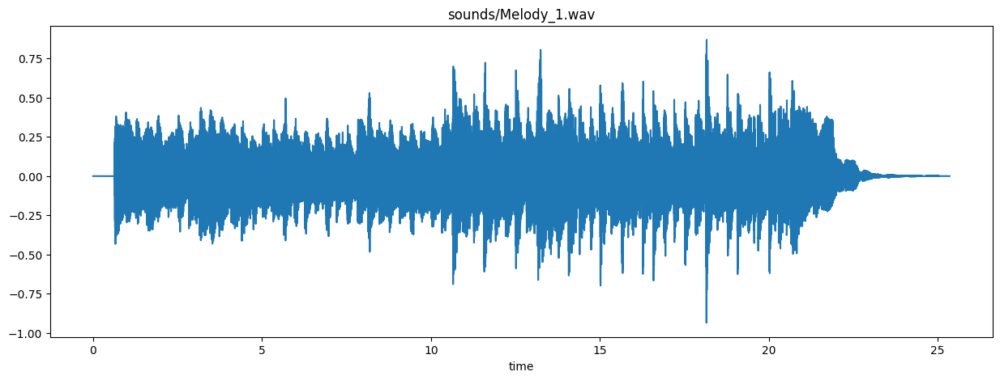

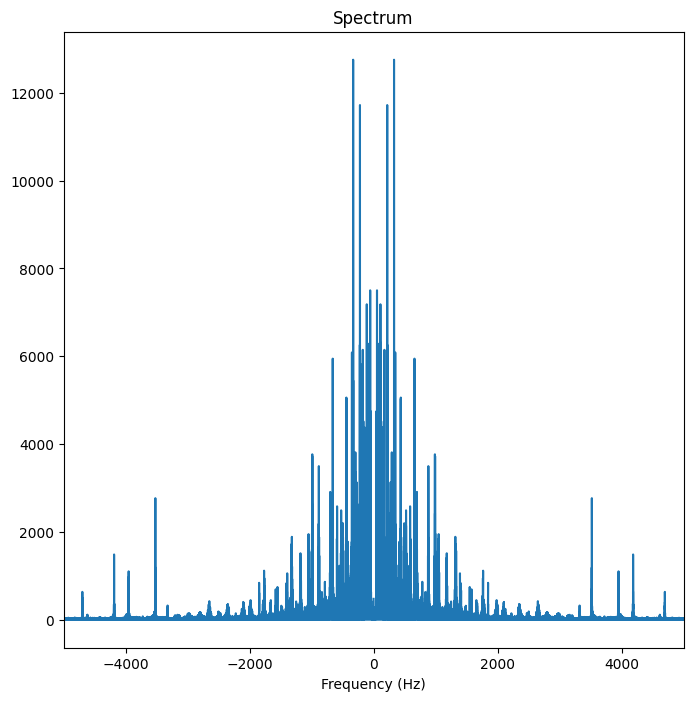

In [74]:
playing('sounds/Melody_1.wav')

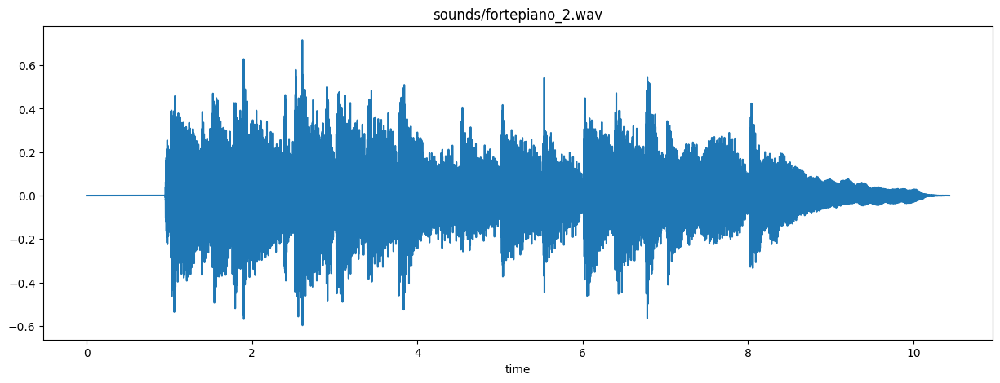

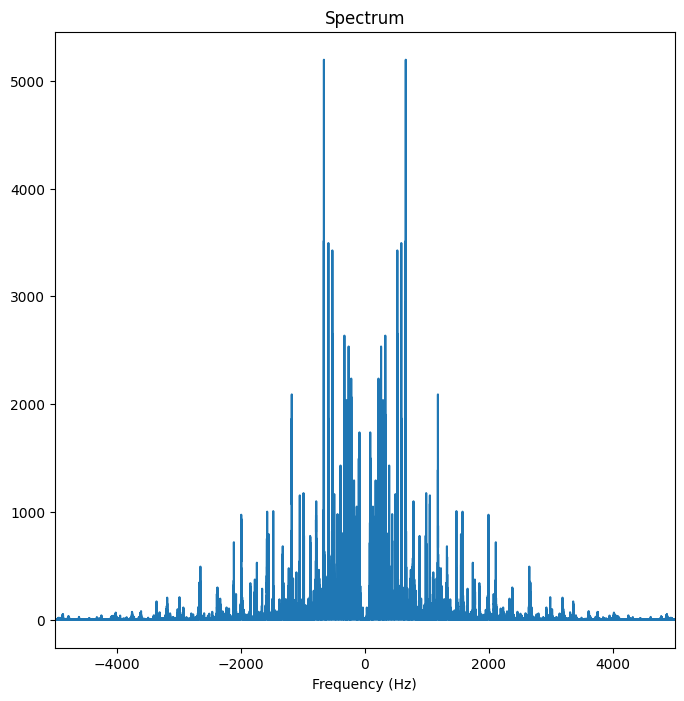

In [75]:
playing('sounds/fortepiano_2.wav')

**Функция для вывода аудио + график + спектр в реальном времени**

In [1]:
def playing_rt(sound):
    
    frequency, data = read(sound)
    data = stereo_to_mono(data)
    
    plt.figure(figsize=(15,5))
    plt.title(sound)
    plt.xlabel('time')
    plt.plot(timeline, data)

    
    y = fft(data)
    x = fftfreq(len(data), 1 / frequency)
    plt.figure(figsize=(8, 8))
    plt.xlim([-5000, 5000])
    plt.title('Spectrum')
    plt.xlabel('Frequency (Hz)')
    plt.plot(x, np.abs(y))
    
    return ipd.Audio(sound)